# Análise dos dados do Enade 2023 - Engenharia de Computação I

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

Lendo os dados:

In [2]:
eng_comp_pb_enade23 = pd.read_csv("C:/Users/aliss/OneDrive/Documentos/estudos/fpcc2/Reproducao/eng_comp_pb_enade23.csv")

In [3]:
eng_comp_pb_enade23

,NU_ANO,CO_CURSO,CO_IES,CO_CATEGAD,CO_ORGACAD,CO_GRUPO,CO_MODALIDADE,CO_MUNIC_CURSO,CO_UF_CURSO,CO_REGIAO_CURSO,...,QE_I17,QE_I18,QE_I19,QE_I20,QE_I21,QE_I22,QE_I23,QE_I24,QE_I25,QE_I26
0,2023,1127164,579,1,10028,6411,1,2507507,25,2,...,B,A,B,K,A,B,C,E,C,C
1,2023,1127164,579,1,10028,6411,1,2507507,25,2,...,B,A,B,C,A,B,C,E,E,C
2,2023,1127164,579,1,10028,6411,1,2507507,25,2,...,B,A,B,C,A,B,C,E,E,C
3,2023,1127164,579,1,10028,6411,1,2507507,25,2,...,B,A,B,C,A,B,C,E,E,C
4,2023,1127164,579,1,10028,6411,1,2507507,25,2,...,B,A,B,C,A,B,C,E,E,C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,2023,1342196,1166,1,10026,6411,1,2504009,25,2,...,A,A,B,C,A,B,C,D,C,E
115,2023,1342196,1166,1,10026,6411,1,2504009,25,2,...,A,A,B,C,A,B,C,E,C,E
116,2023,1342196,1166,1,10026,6411,1,2504009,25,2,...,A,A,B,C,A,B,C,E,C,C
117,2023,1342196,1166,1,10026,6411,1,2504009,25,2,...,A,A,B,C,A,B,C,E,C,F


In [4]:
eng_comp_pb_enade23.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119 entries, 0 to 118
Data columns (total 40 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   NU_ANO           119 non-null    int64  
 1   CO_CURSO         119 non-null    int64  
 2   CO_IES           119 non-null    int64  
 3   CO_CATEGAD       119 non-null    int64  
 4   CO_ORGACAD       119 non-null    int64  
 5   CO_GRUPO         119 non-null    int64  
 6   CO_MODALIDADE    119 non-null    int64  
 7   CO_MUNIC_CURSO   119 non-null    int64  
 8   CO_UF_CURSO      119 non-null    int64  
 9   CO_REGIAO_CURSO  119 non-null    int64  
 10  ID               119 non-null    object 
 11  NT_GER           119 non-null    float64
 12  TP_SEXO          119 non-null    object 
 13  NU_IDADE         119 non-null    int64  
 14  QE_I01           119 non-null    object 
 15  QE_I02           119 non-null    object 
 16  QE_I03           119 non-null    object 
 17  QE_I04          

In [5]:
eng_comp_pb_enade23.columns

Index(['NU_ANO', 'CO_CURSO', 'CO_IES', 'CO_CATEGAD', 'CO_ORGACAD', 'CO_GRUPO',
       'CO_MODALIDADE', 'CO_MUNIC_CURSO', 'CO_UF_CURSO', 'CO_REGIAO_CURSO',
       'ID', 'NT_GER', 'TP_SEXO', 'NU_IDADE', 'QE_I01', 'QE_I02', 'QE_I03',
       'QE_I04', 'QE_I05', 'QE_I06', 'QE_I07', 'QE_I08', 'QE_I09', 'QE_I10',
       'QE_I11', 'QE_I12', 'QE_I13', 'QE_I14', 'QE_I15', 'QE_I16', 'QE_I17',
       'QE_I18', 'QE_I19', 'QE_I20', 'QE_I21', 'QE_I22', 'QE_I23', 'QE_I24',
       'QE_I25', 'QE_I26'],
      dtype='object')

## Sumário dos dados do dataset:

- `NU_ANO`: Ano de realização do exame.
- `CO_CURSO`: Código do curso no Enade.
- `CO_IES`: Código da IES (e-MEC).
- `CO_CATEGAD`: Código da categoria administrativa da IES.
- `CO_ORGACAD`: Código da organização acadêmica da IES.
- `CO_GRUPO`: Código da Área de enquadramento do curso no Enade.
- `CO_MODALIDADE`: Código da Modalidade de Ensino.
- `CO_MUNIC_CURSO`: Código do município de funcionamento do curso.
- `CO_UF_CURSO`: Código da UF de funcionamento do curso.
- `CO_REGIAO_CURSO`: Código da região de funcionamento do curso.
- `ID`: Identificador dos estudantes criado artificialmente em `organizando_dados.ipynb`.
- `NT_GER`: Nota bruta da prova - Média ponderada da formação geral (25%) e componente específico (75%). (valor de 0 a 100).
- `TP_SEXO`: Sexo.
- `NU_IDADE`: Idade do inscrito em 26/11/2023.
- `QE_I01` - `QE_I26`: Questionário socioeconômico do estudante.

Desses dados, já sebemos que `NU_ANO` é 2023, `CO_GRUPO` é 6411 que corresponde a Engenharia de Computação `CO_UF_CURSO` é PB (25) e a `CO_REGIAO_CURSO` é 2 (Região Nordeste (NE))

<hr>

## Análise dos dados:

Iniciaremos com uma análise superficial, analisando primeiro `NT_GER`, `TP_SEXO` e `NU_IDADE`:

### Destribuição das notas:

In [6]:
eng_comp_pb_enade23["NT_GER"].value_counts()

45.5    13
43.0     3
49.1     3
48.2     3
47.9     2
        ..
57.1     1
59.0     1
59.5     1
59.9     1
48.8     1
Name: NT_GER, Length: 91, dtype: int64

Plotanto um gráfico da distribuição das notas:

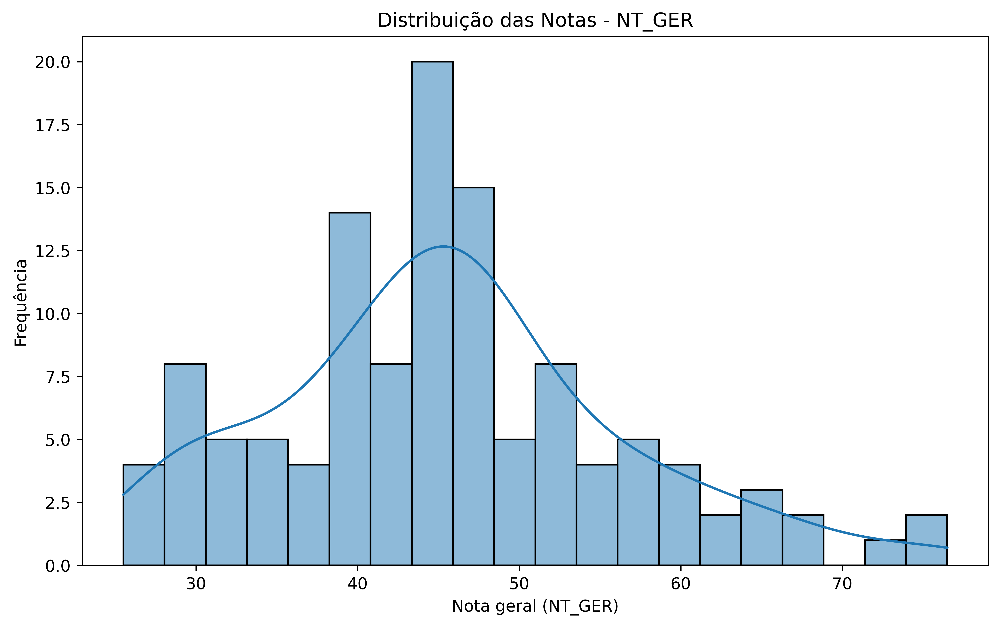

In [7]:
plt.figure(figsize=(10, 6), dpi=600)

sns.histplot(eng_comp_pb_enade23["NT_GER"], bins=20, kde=True)
plt.title("Distribuição das Notas - NT_GER")
plt.xlabel("Nota geral (NT_GER)")
plt.ylabel("Frequência")
plt.show()

Cálculando o Intervalo de Confiança da Média (normal) da distribuição da nota:

In [8]:
notas = eng_comp_pb_enade23["NT_GER"].dropna()

media = notas.mean()
desvio = notas.std(ddof=1)
n = len(notas)
z = 1.96  # IC de 95%

margem_erro = z * (desvio / np.sqrt(n))
ic_inferior = media - margem_erro
ic_superior = media + margem_erro

print(f"IC 95%: [{ic_inferior:.2f}, {ic_superior:.2f}]")

IC 95%: [43.60, 47.45]


### Destribuição do sexo:

In [9]:
sexo_freq = eng_comp_pb_enade23["TP_SEXO"].value_counts()
sexo_freq

M    103
F     16
Name: TP_SEXO, dtype: int64

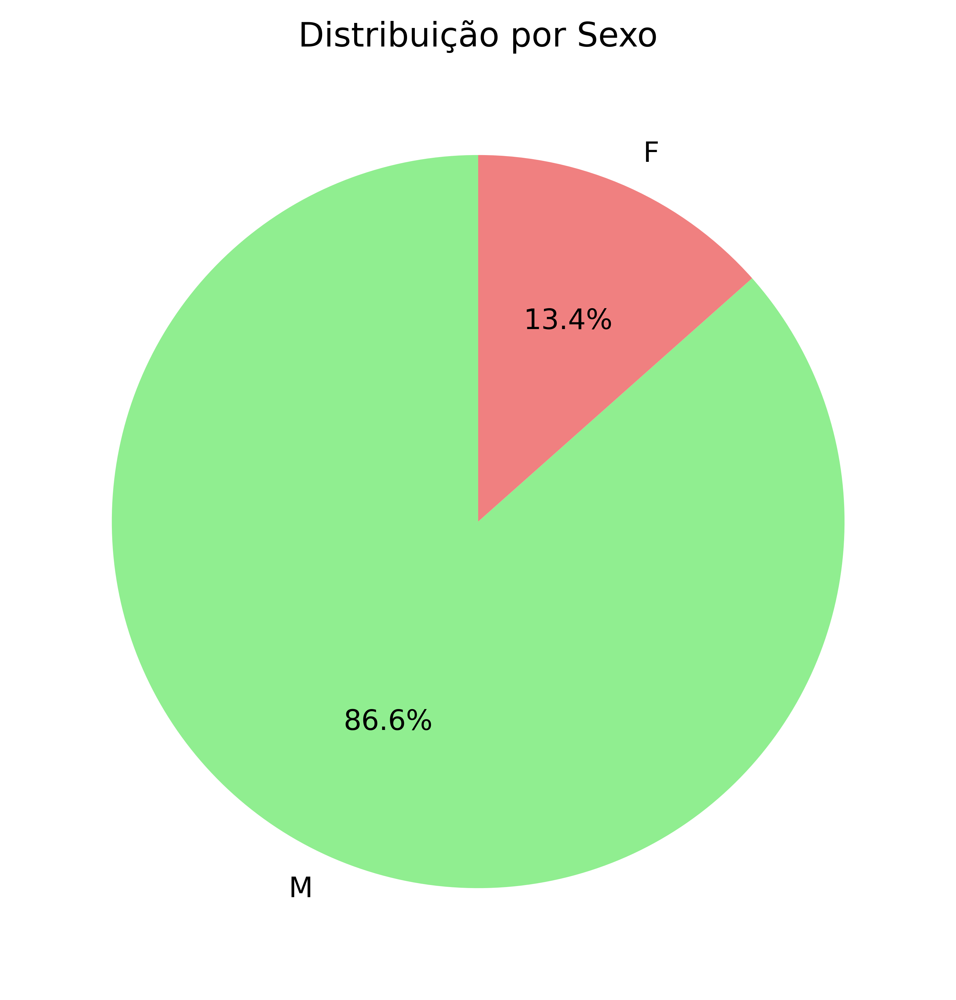

In [10]:
plt.figure(figsize=(10, 6), dpi=600)

sexo_freq.plot.pie(autopct='%1.1f%%', startangle=90, ylabel='', colors=["lightgreen", "lightcoral"])
plt.title('Distribuição por Sexo')
plt.show()

Temos mais pessoas do sexo masculino (M) do que do sexo feminino (F).

### Destribuição da idade:

In [11]:
idades_freq = eng_comp_pb_enade23["NU_IDADE"].value_counts()
idades_freq

24    22
25    20
23    15
26    14
30    10
27     9
22     7
21     5
29     4
28     2
32     2
33     2
31     2
41     2
36     1
37     1
40     1
Name: NU_IDADE, dtype: int64

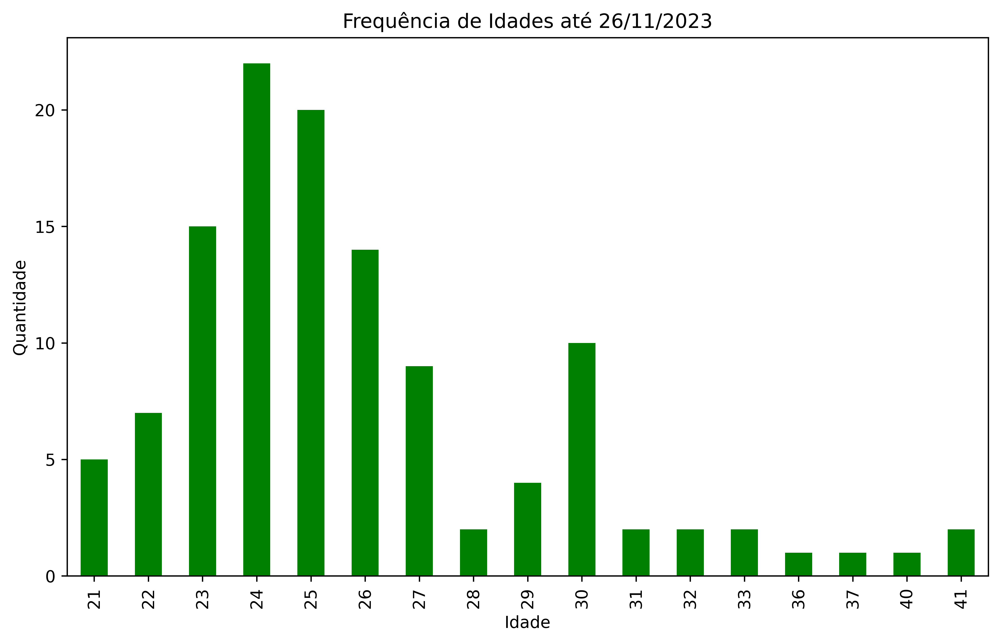

In [12]:
plt.figure(figsize=(10, 6), dpi=600)

idades_freq.sort_index().plot(kind="bar", color="green")

plt.title("Frequência de Idades até 26/11/2023")
plt.xlabel("Idade")
plt.ylabel("Quantidade")
plt.show()

Plotanto um gráfico da distribuição das idades dos estudantes até 26/11/2023:

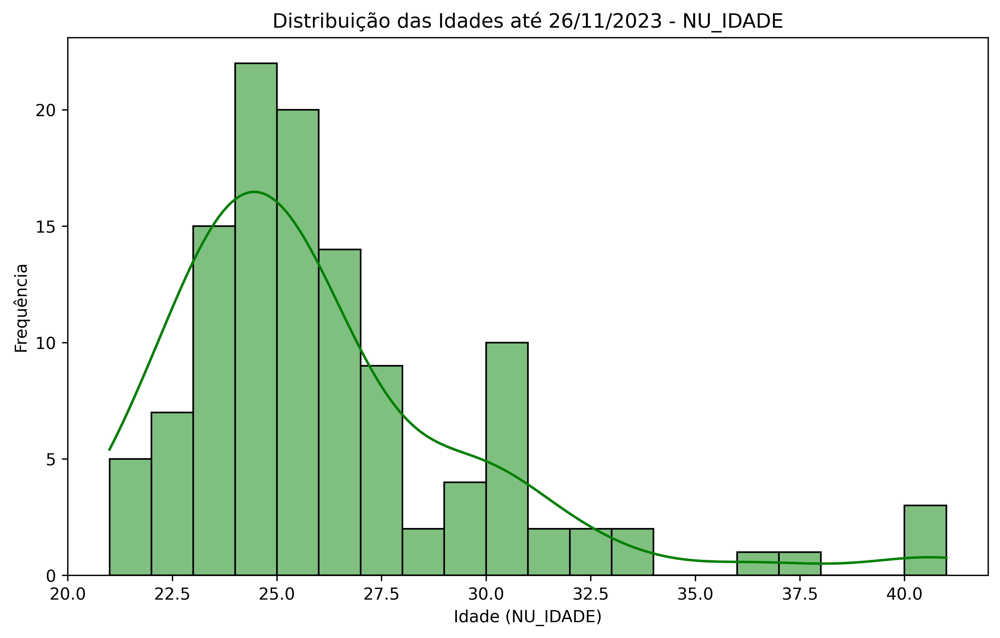

In [13]:
plt.figure(figsize=(10, 6), dpi=600)

sns.histplot(eng_comp_pb_enade23["NU_IDADE"], bins=20, kde=True, color="green")
plt.title("Distribuição das Idades até 26/11/2023 - NU_IDADE")
plt.xlabel("Idade (NU_IDADE)")
plt.ylabel("Frequência")
plt.show()

Cálculando o IC:

In [14]:
idades = eng_comp_pb_enade23["NU_IDADE"].dropna()

media = idades.mean()
desvio = idades.std(ddof=1)
n = len(notas)
z = 1.96  # IC de 95%

margem_erro = z * (desvio / np.sqrt(n))
ic_inferior = media - margem_erro
ic_superior = media + margem_erro

print(f"IC 95%: [{ic_inferior:.2f}, {ic_superior:.2f}]")

IC 95%: [25.34, 26.73]


<hr>

### Análise do Questionário:

In [15]:
def plot_freq_qe(df, qe, legendas, pergunta, 
                 colors = ["#1f77b4","#ff7f0e","#2ca02c","#d62728","#9467bd","#8c564b","#e377c2","#7f7f7f"]):
    
    counts = df[qe].value_counts().sort_index()
    labels = counts.index.tolist()
    valores = counts.values.tolist()

    plt.figure(figsize=(10, 6), dpi=600)

    # Gera as barras manualmente
    bars = plt.bar(labels, valores, color=colors)

    # Associa cada barra a um rótulo
    for bar, label in zip(bars, labels):
        bar.set_label(legendas[label])

    plt.title(pergunta)
    plt.xlabel("Resposta")
    plt.ylabel("Quantidade")
    plt.legend(title="Legenda")
    plt.legend(loc=7, bbox_to_anchor=(-0.1, 0.5))
    plt.show()

#### QE_I01:

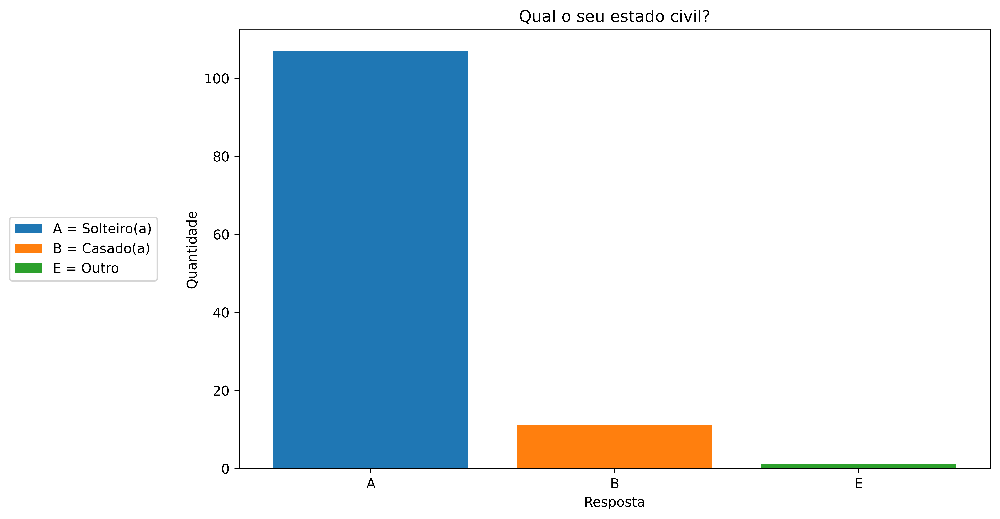

In [16]:
legendas_q1 = {
    "A": "A = Solteiro(a)",
    "B": "B = Casado(a)",
    "C": "C = Separado(a)/Divorciado(a)",
    "D": "D = Viúvo(a)",
    "E": "E = Outro"
}

p1 = "Qual o seu estado civil?"

plot_freq_qe(eng_comp_pb_enade23, "QE_I01", legendas_q1, p1)

#### QE_I02:

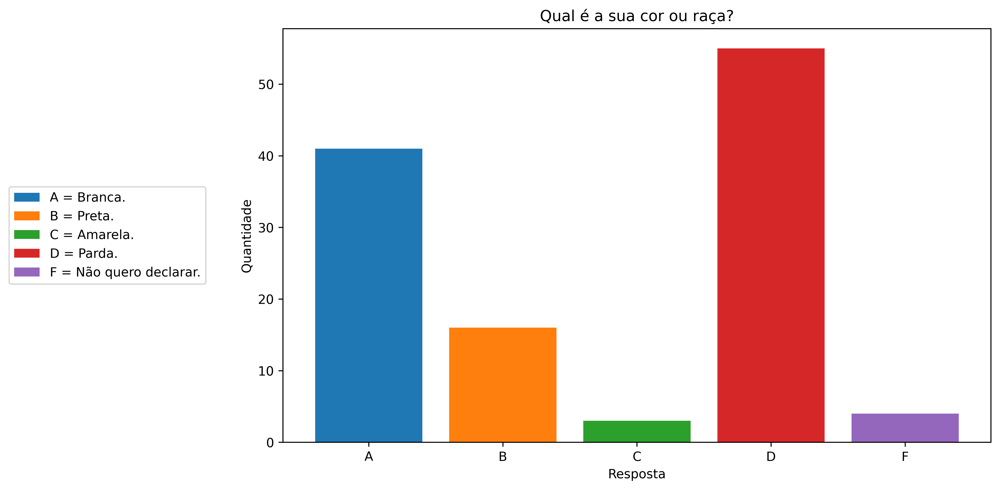

In [17]:
legendas_q2 = {
    "A": "A = Branca.",
    "B": "B = Preta.",
    "C": "C = Amarela.",
    "D": "D = Parda.",
    "E": "E = Indígena.",
    "F": "F = Não quero declarar."
}

p2 = "Qual é a sua cor ou raça?"

plot_freq_qe(eng_comp_pb_enade23, "QE_I02", legendas_q2, p2)

#### QE_I03:

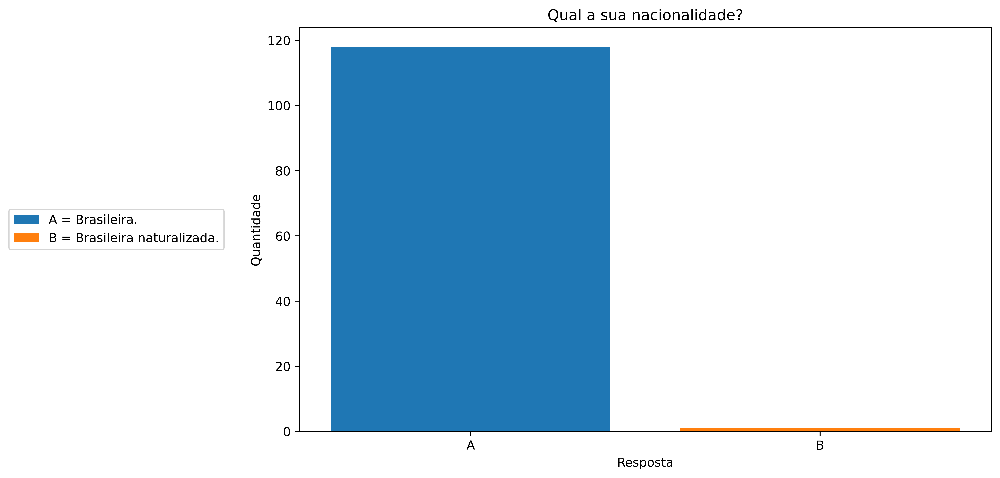

In [18]:
legendas_q3 = {
    "A": "A = Brasileira.",
    "B": "B = Brasileira naturalizada.",
    "C": "C = Estrangeira."
}

p3 = "Qual a sua nacionalidade?"

plot_freq_qe(eng_comp_pb_enade23, "QE_I03", legendas_q3, p3)

#### QE_I04:

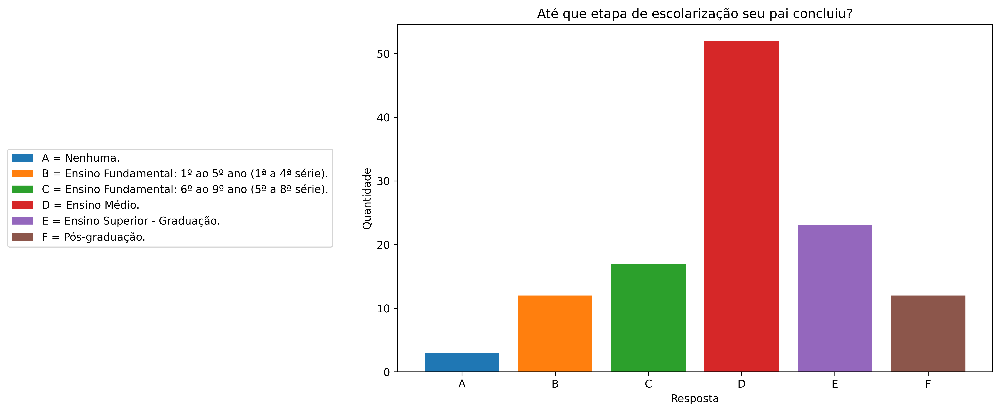

In [19]:
legendas_q45 = {
    "A": "A = Nenhuma.",
    "B": "B = Ensino Fundamental: 1º ao 5º ano (1ª a 4ª série).",
    "C": "C = Ensino Fundamental: 6º ao 9º ano (5ª a 8ª série).",
    "D": "D = Ensino Médio.",
    "E": "E = Ensino Superior - Graduação.",
    "F": "F = Pós-graduação."
}

p4 = "Até que etapa de escolarização seu pai concluiu?"

plot_freq_qe(eng_comp_pb_enade23, "QE_I04", legendas_q45, p4)

#### QE_I05:

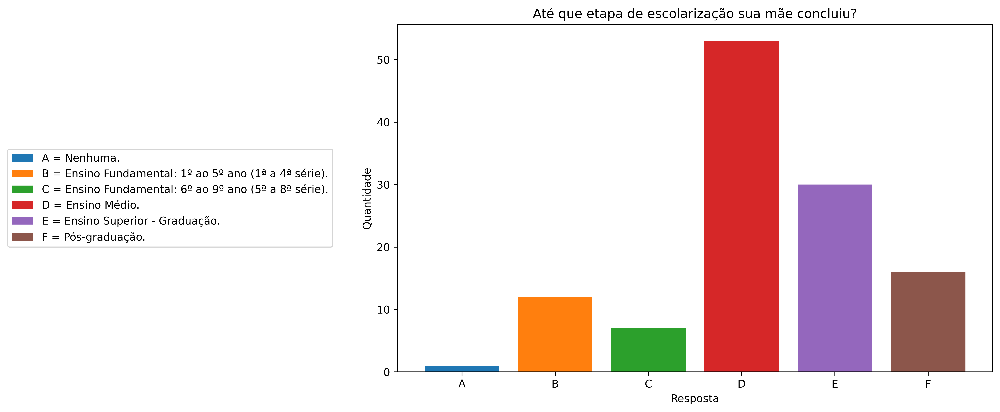

In [20]:
p5 = "Até que etapa de escolarização sua mãe concluiu?"

plot_freq_qe(eng_comp_pb_enade23, "QE_I05", legendas_q45, p5)

#### QE_I06:

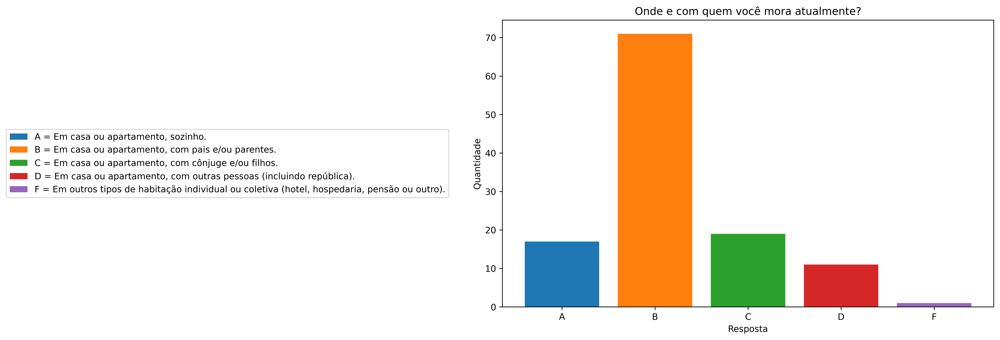

In [21]:
legendas_q6 = {
    "A": "A = Em casa ou apartamento, sozinho.",
    "B": "B = Em casa ou apartamento, com pais e/ou parentes.",
    "C": "C = Em casa ou apartamento, com cônjuge e/ou filhos.",
    "D": "D = Em casa ou apartamento, com outras pessoas (incluindo república).",
    "E": "E = Em alojamento universitário da própria instituição.",
    "F": "F = Em outros tipos de habitação individual ou coletiva (hotel, hospedaria, pensão ou outro)."
}

p6 = "Onde e com quem você mora atualmente?"

plot_freq_qe(eng_comp_pb_enade23, "QE_I06", legendas_q6, p6)

#### QE_I07:

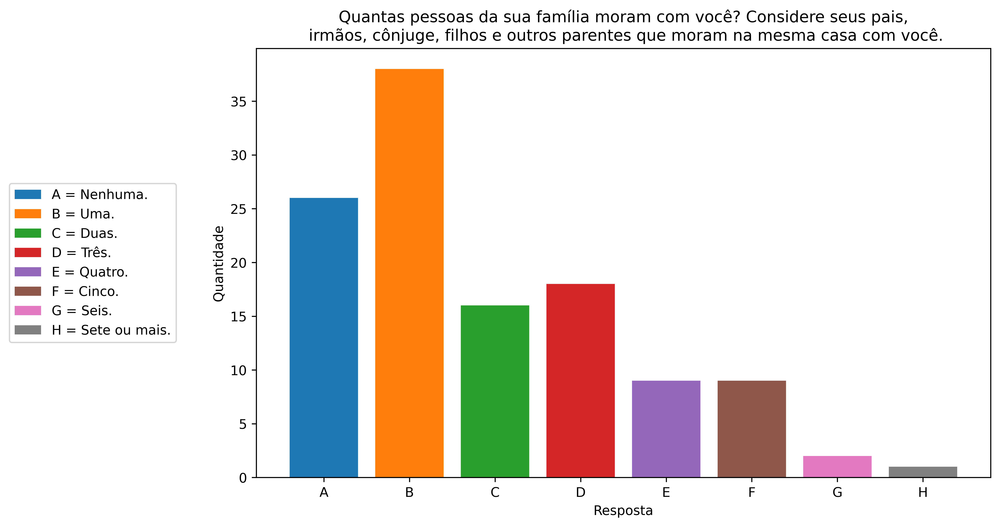

In [22]:
p7 = "Quantas pessoas da sua família moram com você? Considere seus pais,\n irmãos, cônjuge, filhos e outros parentes que moram na mesma casa com você."

legendas_q7 = {
    "A": "A = Nenhuma.",
    "B": "B = Uma.",
    "C": "C = Duas.",
    "D": "D = Três.",
    "E": "E = Quatro.",
    "F": "F = Cinco.",
    "G": "G = Seis.",
    "H": "H = Sete ou mais."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I07", legendas_q7, p7)

#### QE_I08:

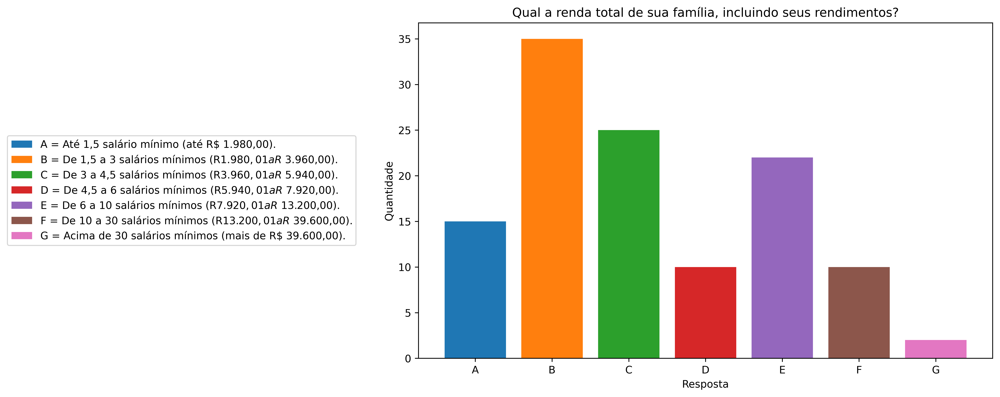

In [23]:
p8 = "Qual a renda total de sua família, incluindo seus rendimentos?"
legendas_q8 = {
    "A": "A = Até 1,5 salário mínimo (até R$ 1.980,00).",
    "B": "B = De 1,5 a 3 salários mínimos (R$ 1.980,01 a R$ 3.960,00).",
    "C": "C = De 3 a 4,5 salários mínimos (R$ 3.960,01 a R$ 5.940,00).",
    "D": "D = De 4,5 a 6 salários mínimos (R$ 5.940,01 a R$ 7.920,00).",
    "E": "E = De 6 a 10 salários mínimos (R$ 7.920,01 a R$ 13.200,00).",
    "F": "F = De 10 a 30 salários mínimos (R$ 13.200,01 a R$ 39.600,00).",
    "G": "G = Acima de 30 salários mínimos (mais de R$ 39.600,00)."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I08", legendas_q8, p8)

#### QE_I09:

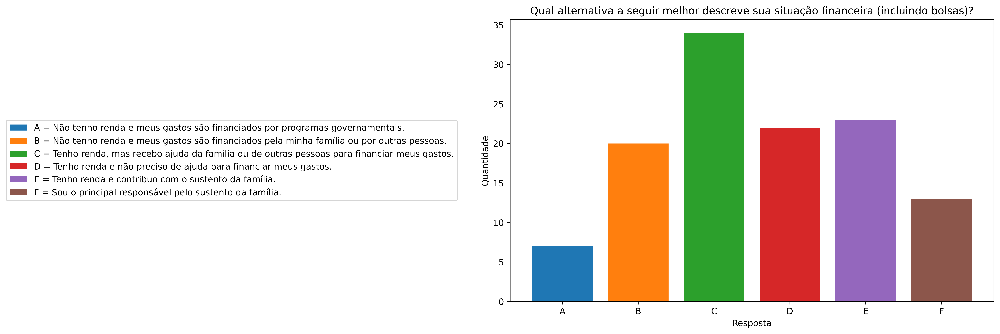

In [24]:
p9 = "Qual alternativa a seguir melhor descreve sua situação financeira (incluindo bolsas)?"
legendas_q9 = {
    "A": "A = Não tenho renda e meus gastos são financiados por programas governamentais.",
    "B": "B = Não tenho renda e meus gastos são financiados pela minha família ou por outras pessoas.",
    "C": "C = Tenho renda, mas recebo ajuda da família ou de outras pessoas para financiar meus gastos.",
    "D": "D = Tenho renda e não preciso de ajuda para financiar meus gastos.",
    "E": "E = Tenho renda e contribuo com o sustento da família.",
    "F": "F = Sou o principal responsável pelo sustento da família."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I09", legendas_q9, p9)

#### QE_I10:

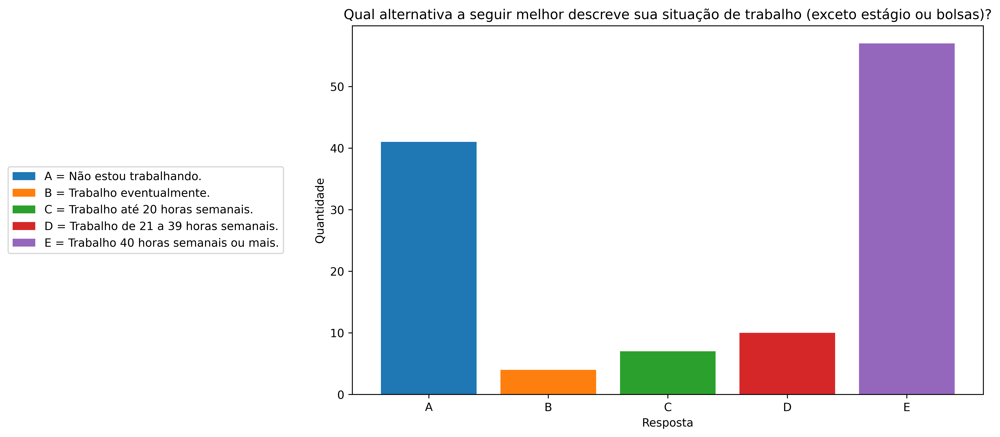

In [25]:
p10 = "Qual alternativa a seguir melhor descreve sua situação de trabalho (exceto estágio ou bolsas)?"
legendas_q10 = {
    "A": "A = Não estou trabalhando.",
    "B": "B = Trabalho eventualmente.",
    "C": "C = Trabalho até 20 horas semanais.",
    "D": "D = Trabalho de 21 a 39 horas semanais.",
    "E": "E = Trabalho 40 horas semanais ou mais."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I10", legendas_q10, p10)

#### QE_I11:

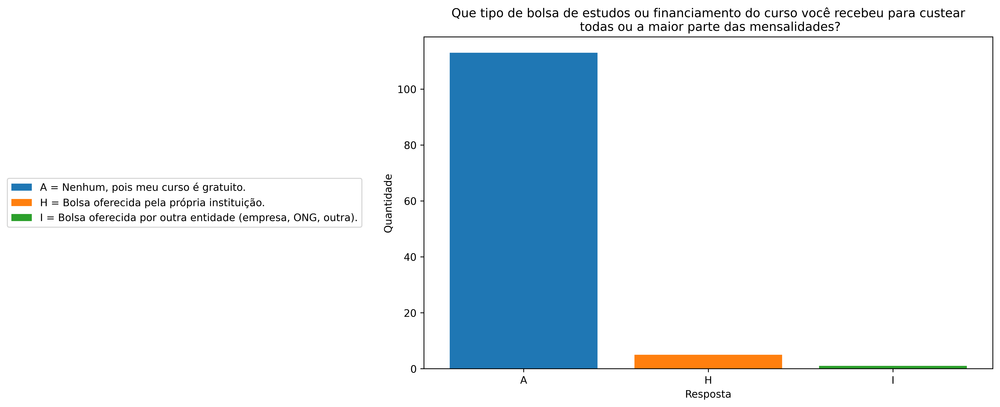

In [26]:
p11 = "Que tipo de bolsa de estudos ou financiamento do curso você recebeu para custear\n todas ou a maior parte das mensalidades?"
legendas_q11 = {
    "A": "A = Nenhum, pois meu curso é gratuito.",
    "B": "B = Nenhum, embora meu curso não seja gratuito.",
    "C": "C = ProUni integral.",
    "D": "D = ProUni parcial, apenas.",
    "E": "E = FIES, apenas.",
    "F": "F = ProUni Parcial e FIES.",
    "G": "G = Bolsa oferecida por governo estadual, distrital ou municipal.",
    "H": "H = Bolsa oferecida pela própria instituição.",
    "I": "I = Bolsa oferecida por outra entidade (empresa, ONG, outra).",
    "J": "J = Financiamento oferecido pela própria instituição.",
    "K": "K = Financiamento bancário."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I11", legendas_q11, p11)

#### QE_I12:

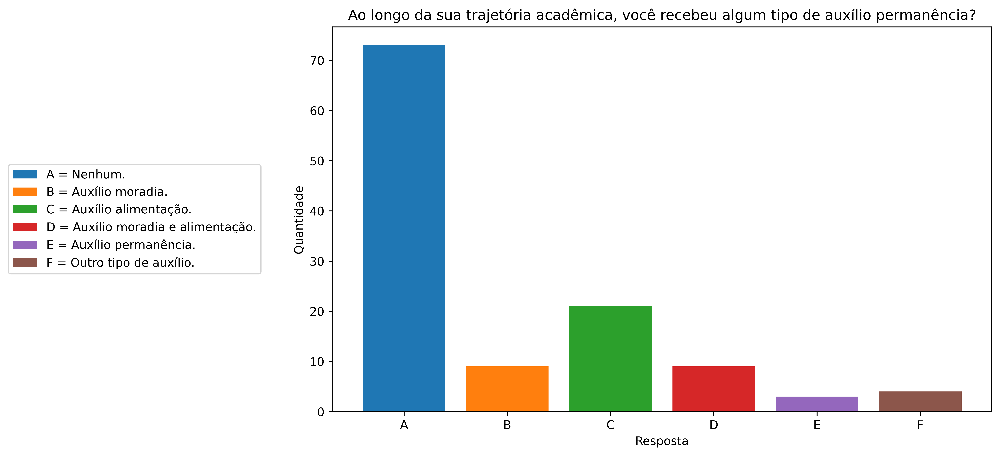

In [27]:
p12 = "Ao longo da sua trajetória acadêmica, você recebeu algum tipo de auxílio permanência?"
legendas_q12 = {
    "A": "A = Nenhum.",
    "B": "B = Auxílio moradia.",
    "C": "C = Auxílio alimentação.",
    "D": "D = Auxílio moradia e alimentação.",
    "E": "E = Auxílio permanência.",
    "F": "F = Outro tipo de auxílio."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I12", legendas_q12, p12)

#### QE_I13:

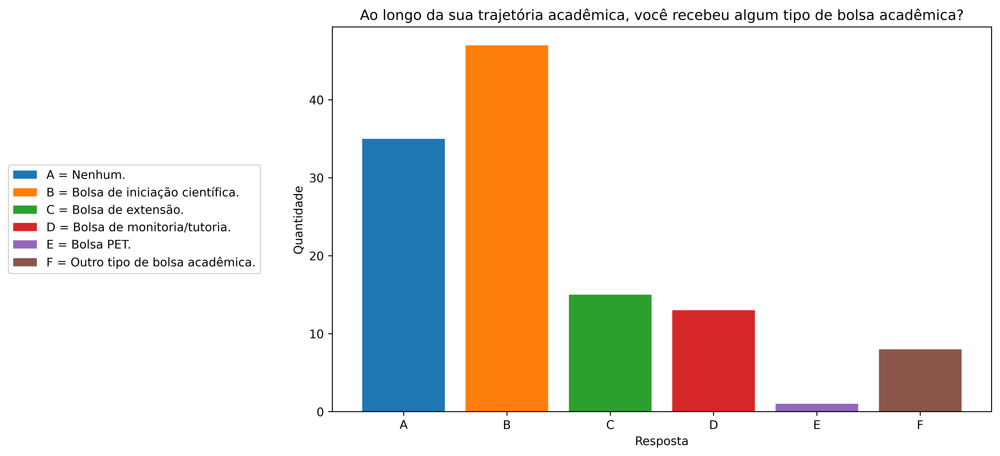

In [28]:
p13 = "Ao longo da sua trajetória acadêmica, você recebeu algum tipo de bolsa acadêmica?"
legendas_q13 = {
    "A": "A = Nenhum.",
    "B": "B = Bolsa de iniciação científica.",
    "C": "C = Bolsa de extensão.",
    "D": "D = Bolsa de monitoria/tutoria.",
    "E": "E = Bolsa PET.",
    "F": "F = Outro tipo de bolsa acadêmica."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I13", legendas_q13, p13)

#### QE_I14:

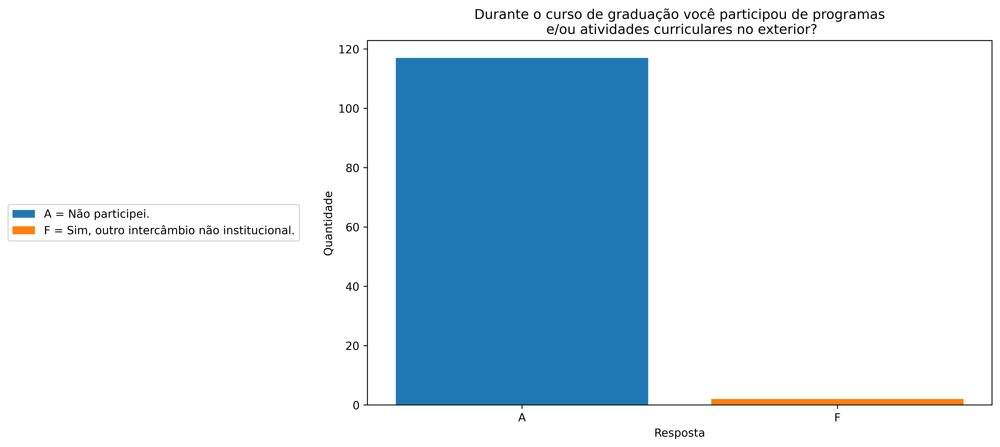

In [29]:
p14 = "Durante o curso de graduação você participou de programas\n e/ou atividades curriculares no exterior?"
legendas_q14 = {
    "A": "A = Não participei.",
    "B": "B = Sim, Programa Ciência sem Fronteiras.",
    "C": "C = Sim, programa de intercâmbio financiado pelo Governo Federal.",
    "D": "D = Sim, programa de intercâmbio financiado pelo Governo Estadual.",
    "E": "E = Sim, programa de intercâmbio da minha instituição.",
    "F": "F = Sim, outro intercâmbio não institucional."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I14", legendas_q14, p14)

#### QE_I15:

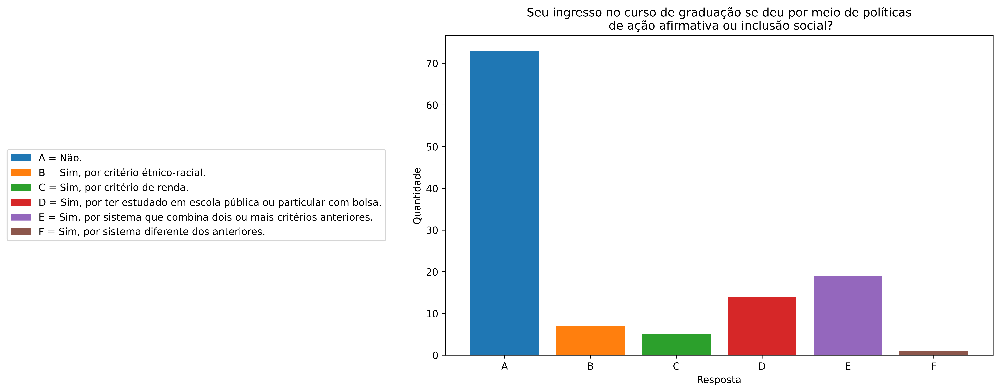

In [30]:
p15 = "Seu ingresso no curso de graduação se deu por meio de políticas\n de ação afirmativa ou inclusão social?"
legendas_q15 = {
    "A": "A = Não.",
    "B": "B = Sim, por critério étnico-racial.",
    "C": "C = Sim, por critério de renda.",
    "D": "D = Sim, por ter estudado em escola pública ou particular com bolsa.",
    "E": "E = Sim, por sistema que combina dois ou mais critérios anteriores.",
    "F": "F = Sim, por sistema diferente dos anteriores."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I15", legendas_q15, p15)

#### QE_I16:

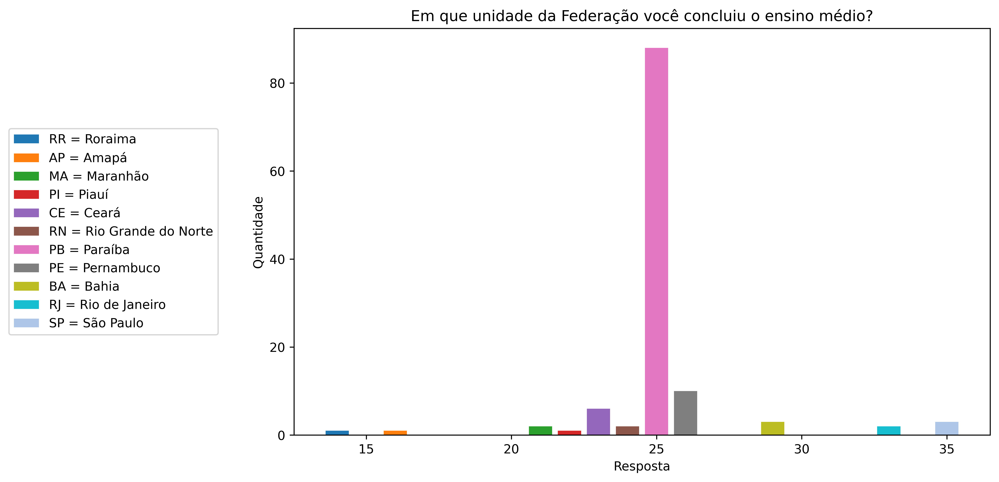

In [31]:
p16 = "Em que unidade da Federação você concluiu o ensino médio?"
legendas_q16 = {
    11: "RO = Rondônia",
    12: "AC = Acre",
    13: "AM = Amazonas",
    14: "RR = Roraima",
    15: "PA = Pará",
    16: "AP = Amapá",
    17: "TO = Tocantins",
    21: "MA = Maranhão",
    22: "PI = Piauí",
    23: "CE = Ceará",
    24: "RN = Rio Grande do Norte",
    25: "PB = Paraíba",
    26: "PE = Pernambuco",
    27: "AL = Alagoas",
    28: "SE = Sergipe",
    29: "BA = Bahia",
    31: "MG = Minas Gerais",
    32: "ES = Espírito Santo",
    33: "RJ = Rio de Janeiro",
    35: "SP = São Paulo",
    41: "PR = Paraná",
    42: "SC = Santa Catarina",
    43: "RS = Rio Grande do Sul",
    50: "MS = Mato Grosso do Sul",
    51: "MT = Mato Grosso",
    52: "GO = Goiás",
    53: "DF = Distrito Federal"
}

colors = [
    "#1f77b4",  # azul
    "#ff7f0e",  # laranja
    "#2ca02c",  # verde
    "#d62728",  # vermelho
    "#9467bd",  # roxo
    "#8c564b",  # marrom
    "#e377c2",  # rosa
    "#7f7f7f",  # cinza
    "#bcbd22",  # oliva
    "#17becf",  # ciano
    "#aec7e8"   # azul claro
]


plot_freq_qe(eng_comp_pb_enade23, "QE_I16", legendas_q16, p16, colors=colors)

#### QE_I17:

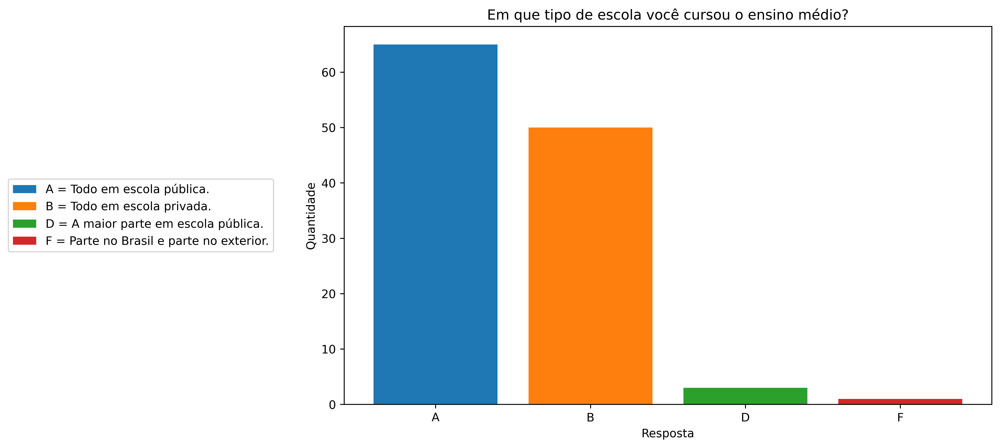

In [32]:
p17 = "Em que tipo de escola você cursou o ensino médio?"
legendas_q17 = {
    "A": "A = Todo em escola pública.",
    "B": "B = Todo em escola privada.",
    "C": "C = Todo no exterior.",
    "D": "D = A maior parte em escola pública.",
    "E": "E = A maior parte em escola privada.",
    "F": "F = Parte no Brasil e parte no exterior."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I17", legendas_q17, p17)

#### QE_I18:

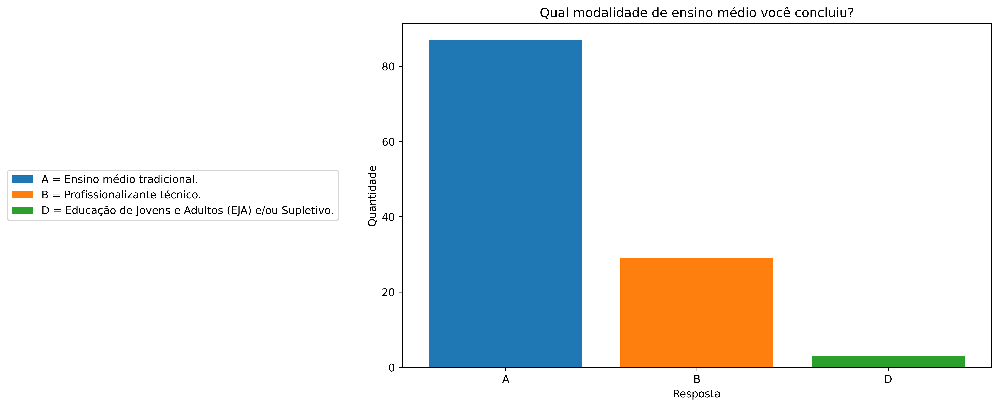

In [33]:
p18 = "Qual modalidade de ensino médio você concluiu?"
legendas_q18 = {
    "A": "A = Ensino médio tradicional.",
    "B": "B = Profissionalizante técnico.",
    "C": "C = Profissionalizante magistério (Curso Normal).",
    "D": "D = Educação de Jovens e Adultos (EJA) e/ou Supletivo.",
    "E": "E = Outra modalidade."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I18", legendas_q18, p18)

#### QE_I19:

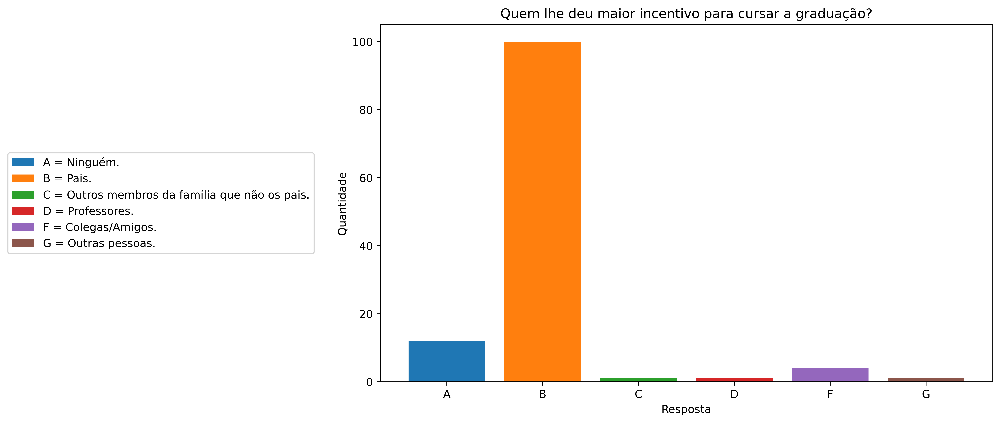

In [34]:
p19 = "Quem lhe deu maior incentivo para cursar a graduação?"
legendas_q19 = {
    "A": "A = Ninguém.",
    "B": "B = Pais.",
    "C": "C = Outros membros da família que não os pais.",
    "D": "D = Professores.",
    "E": "E = Líder ou representante religioso.",
    "F": "F = Colegas/Amigos.",
    "G": "G = Outras pessoas."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I19", legendas_q19, p19)

#### QE_I20:

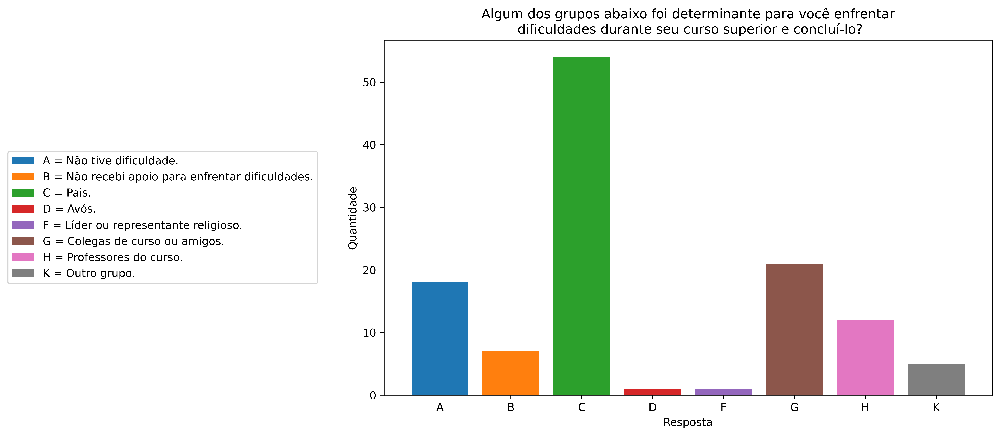

In [35]:
p20 = "Algum dos grupos abaixo foi determinante para você enfrentar\n dificuldades durante seu curso superior e concluí-lo?"
legendas_q20 = {
    "A": "A = Não tive dificuldade.",
    "B": "B = Não recebi apoio para enfrentar dificuldades.",
    "C": "C = Pais.",
    "D": "D = Avós.",
    "E": "E = Irmãos, primos ou tios.",
    "F": "F = Líder ou representante religioso.",
    "G": "G = Colegas de curso ou amigos.",
    "H": "H = Professores do curso.",
    "I": "I = Profissionais do serviço de apoio ao estudante da IES.",
    "J": "J = Colegas de trabalho.",
    "K": "K = Outro grupo."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I20", legendas_q20, p20)

#### QE_I21:

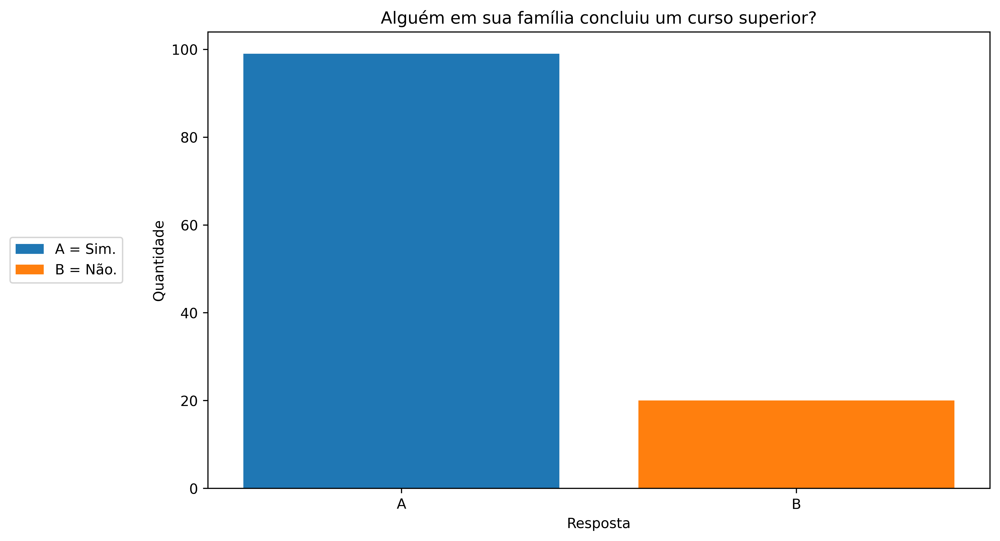

In [36]:
p21 = "Alguém em sua família concluiu um curso superior?"
legendas_q21 = {
    "A": "A = Sim.",
    "B": "B = Não."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I21", legendas_q21, p21)

#### QE_I22:

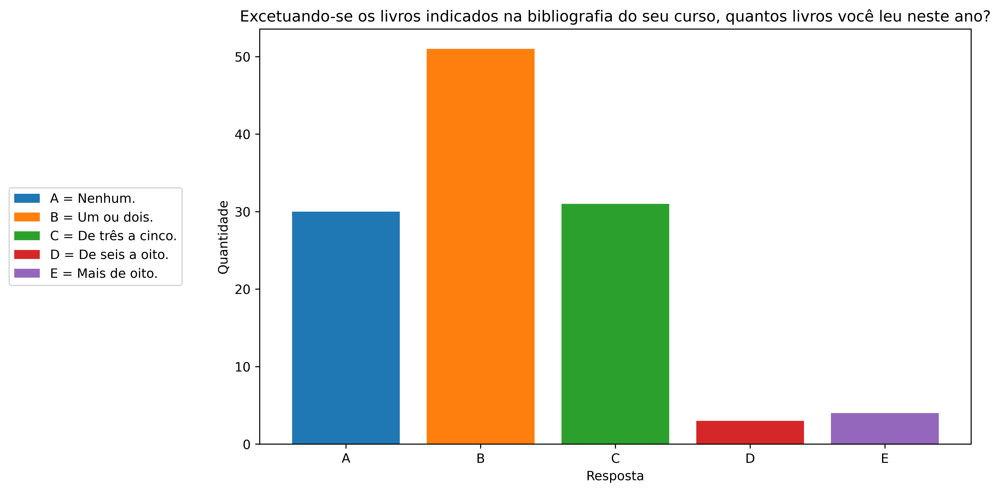

In [37]:
p22 = "Excetuando-se os livros indicados na bibliografia do seu curso, quantos livros você leu neste ano?"
legendas_q22 = {
    "A": "A = Nenhum.",
    "B": "B = Um ou dois.",
    "C": "C = De três a cinco.",
    "D": "D = De seis a oito.",
    "E": "E = Mais de oito."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I22", legendas_q22, p22)

#### QE_I23:

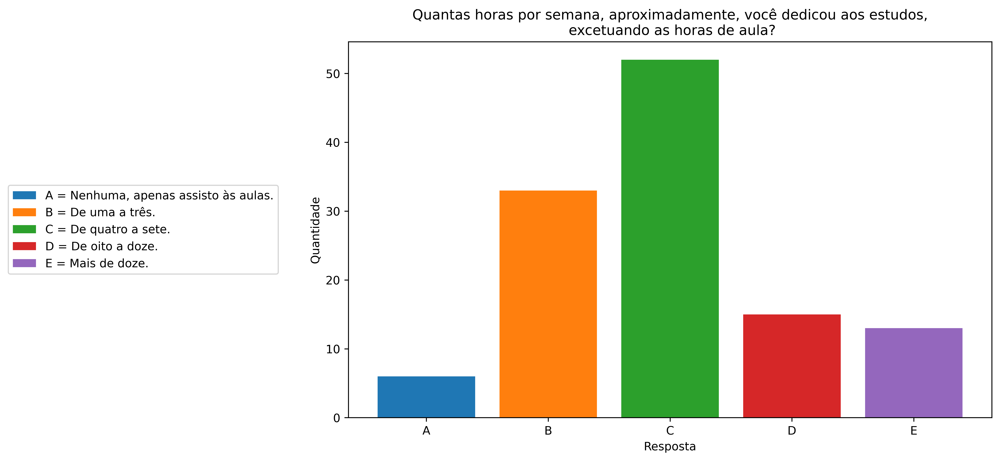

In [38]:
p23 = "Quantas horas por semana, aproximadamente, você dedicou aos estudos,\n excetuando as horas de aula?"
legendas_q23 = {
    "A": "A = Nenhuma, apenas assisto às aulas.",
    "B": "B = De uma a três.",
    "C": "C = De quatro a sete.",
    "D": "D = De oito a doze.",
    "E": "E = Mais de doze."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I23", legendas_q23, p23)

#### QE_I26:

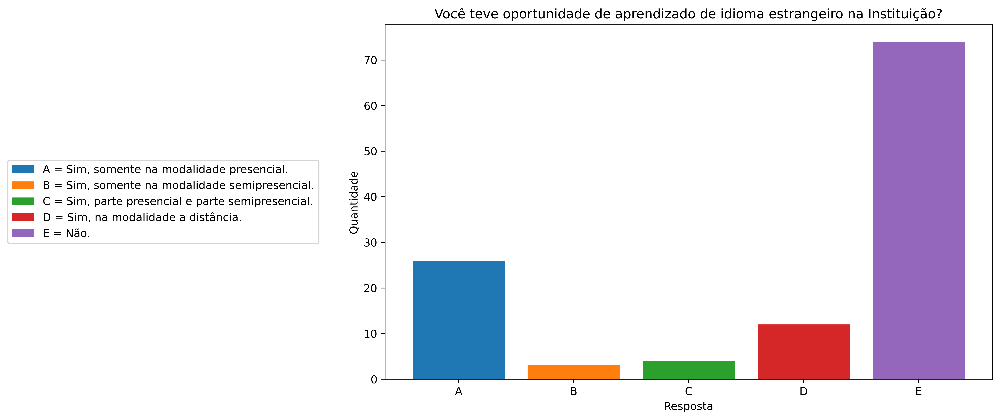

In [39]:
p24 = "Você teve oportunidade de aprendizado de idioma estrangeiro na Instituição?"
legendas_q24 = {
    "A": "A = Sim, somente na modalidade presencial.",
    "B": "B = Sim, somente na modalidade semipresencial.",
    "C": "C = Sim, parte presencial e parte semipresencial.",
    "D": "D = Sim, na modalidade a distância.",
    "E": "E = Não."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I24", legendas_q24, p24)

#### QE_I25:

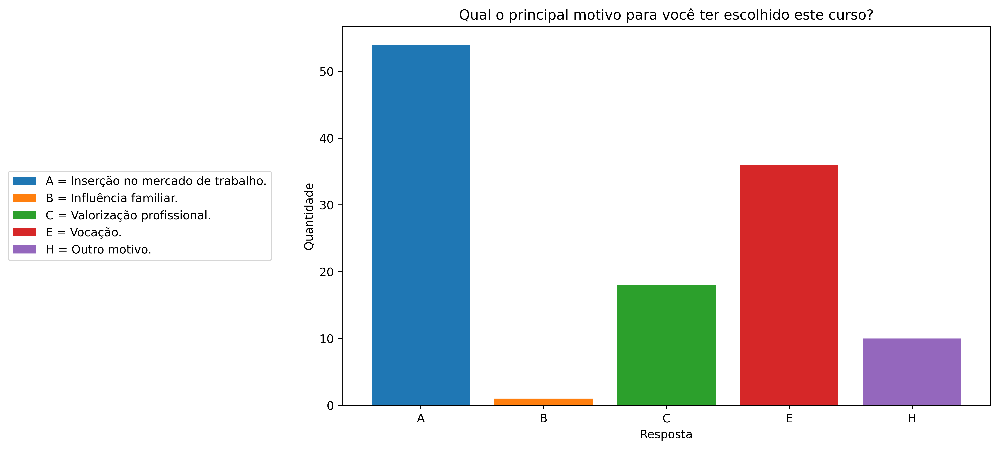

In [40]:
p25 = "Qual o principal motivo para você ter escolhido este curso?"
legendas_q25 = {
    "A": "A = Inserção no mercado de trabalho.",
    "B": "B = Influência familiar.",
    "C": "C = Valorização profissional.",
    "D": "D = Prestígio Social.",
    "E": "E = Vocação.",
    "F": "F = Oferecido na modalidade a distância.",
    "G": "G = Baixa concorrência para ingresso.",
    "H": "H = Outro motivo."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I25", legendas_q25, p25)

#### QE_I26:

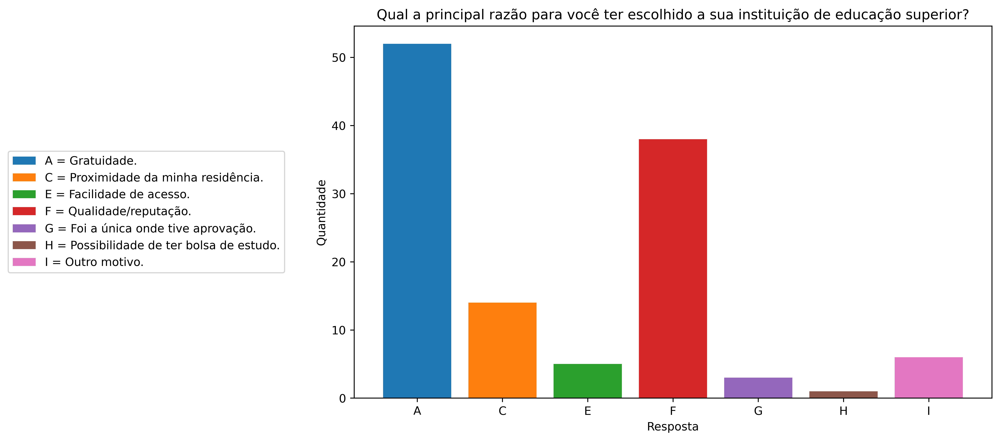

In [41]:
p26 = "Qual a principal razão para você ter escolhido a sua instituição de educação superior?"
legendas_q26 = {
    "A": "A = Gratuidade.",
    "B": "B = Preço da mensalidade.",
    "C": "C = Proximidade da minha residência.",
    "D": "D = Proximidade do meu trabalho.",
    "E": "E = Facilidade de acesso.",
    "F": "F = Qualidade/reputação.",
    "G": "G = Foi a única onde tive aprovação.",
    "H": "H = Possibilidade de ter bolsa de estudo.",
    "I": "I = Outro motivo."
}

plot_freq_qe(eng_comp_pb_enade23, "QE_I26", legendas_q26, p26)

<hr>

## Pré-processamento e Regressão Linear:

Aplicando regressão linear com `NT_GER` como variável alvo, adaptado para o seu contexto com variáveis socioeconômica, como `QE_I01` a `QE_I26`, `TP_SEXO` e `NU_IDADE`:

In [42]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

# Selecionar colunas para o modelo
variaveis_explicativas = [
    'TP_SEXO', 'NU_IDADE'
] + [f'QE_I{str(i).zfill(2)}' for i in range(1, 27)]  # QE_I01 a QE_I26

# Criação do DataFrame com X e y
df_modelo = eng_comp_pb_enade23[variaveis_explicativas + ['NT_GER']].dropna()

X = df_modelo.drop(columns='NT_GER')
y = df_modelo['NT_GER']

# Codificar variáveis categóricas
X_dummies = pd.get_dummies(X, drop_first=True)

# Separar em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_dummies, y, test_size=2, random_state=42)

Criar e treinar o modelo:

In [43]:
modelo = LinearRegression()
modelo.fit(X_train, y_train)

LinearRegression()

Predição e avaliação do modelo:

In [44]:
y_pred = modelo.predict(X_test)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print(f"R²: {r2:.4f} \nMSE: {mse:.2f}")

R²: -138.0351 
MSE: 1129.31


Mostrar os coeficientes ordenados por importância (valor absoluto):

In [45]:
coeficientes = pd.Series(modelo.coef_, index=X_dummies.columns)
coef_ordenados = coeficientes.sort_values(key=abs, ascending=False)

print("Principais fatores que influenciam a nota NT_GER:")
print(coef_ordenados.head(10))

Principais fatores que influenciam a nota NT_GER:
QE_I13_E    78.880992
QE_I07_H   -48.684924
QE_I26_E   -47.660456
QE_I19_D    45.475267
QE_I26_H   -45.210710
QE_I15_C   -41.482563
QE_I25_B    38.971591
QE_I02_C    35.920346
QE_I03_B   -35.435042
QE_I06_D    35.387783
dtype: float64


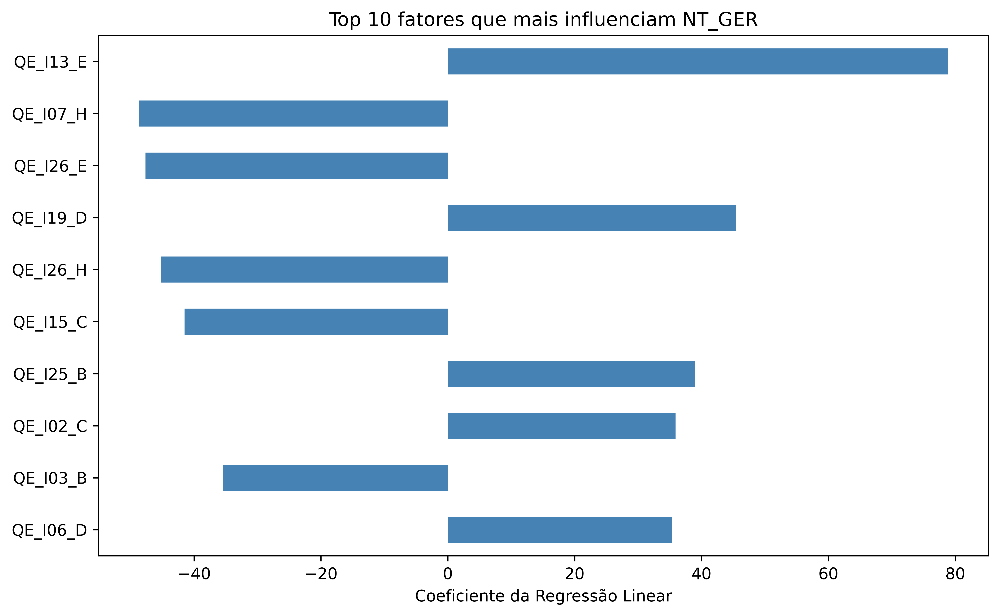

In [46]:
plt.figure(figsize=(10, 6), dpi=600)

coef_ordenados.head(10).plot(kind='barh', color='steelblue')

plt.title("Top 10 fatores que mais influenciam NT_GER")
plt.xlabel("Coeficiente da Regressão Linear")
plt.gca().invert_yaxis()
plt.show()

Na tentativa de identificar os fatores socioeconômicos com maior influência sobre o desempenho dos estudantes, foi aplicada uma regressão linear múltipla tendo a nota geral (`NT_GER`) como variável dependente. No entanto, devido à ausência de um identificador único que permita a vinculação direta entre as respostas ao questionário e os dados de desempenho individual, foi necessário realizar a junção dos conjuntos de dados com base em um índice artificial (`ID`). Isso pode ter comprometido a correspondência entre os registros e, consequentemente, afetado a acurácia do modelo. O baixo desempenho da regressão (R² negativo) indica que a análise preditiva, nas condições disponíveis, não foi eficiente para explicar a variabilidade das notas a partir das variáveis socioeconômicas.